## <div align="center">**Sentinel image analysis**</div>

### Once we have cropped and resampled raw images in order to get our area of interest, we can display and process them.

In [28]:
from image_functions import *
from matplotlib import pyplot as plt
import numpy as np

### Here one can choose three Sentinel bands and combine them in "RGB" image. Depending on position of each band in RGB image results in different color of the overall image.

### Different channels has different resolution, so it needs to be resampled in order to be able to put them together. You can check the channel resolution [here](https://sentinels.copernicus.eu/web/sentinel/user-guides/sentinel-2-msi/resolutions/spatial).

In [29]:
# Resizing channels for 20 m double, 60m 6 times
folder_img = "Praha_sunny/"
file_temp = "B02.tif"
file_res = ["B05.tif", "B06.tif", "B11.tif", "B12.tif"]

In [30]:
for n in range(len(file_res)):
    resampled = resampling(folder_img,file_temp,file_res[n],2)

In [31]:
file_res = ["B09.tif"]
resampled_09 = resampling(folder_img,file_temp,file_res[0],6)

In [32]:
img_rgb = load_sentinel_image(folder_img, ["B02", "B03", "B04"])
img_nir = load_sentinel_image(folder_img, ["B03", "B04", "B06_res"])

rgb = image_rgb(img_rgb, 'B04', 'B03', 'B02', alpha=5.)
nir = image_rgb(img_nir, 'B06_res', 'B04', 'B03', alpha=5.)

#### We can compute spectral index using different bands. In this notebook we calculate Normalized Difference (ND) index using custom function. ND index is defined as:

$$ 
ND = (Band1 - Band2)/ (Band1 + Band2) 
$$

#### Here we calculate two indexes, where different areas are emphasized.

In [33]:
img_nir2 = load_sentinel_image(folder_img, ["B03", "B04", "B05_res"])

# Calculating two indices
ndvi = normalized_difference(img_nir2, 'B05_res', 'B04')
mndwi = normalized_difference(img_nir2, 'B03', 'B05_res')

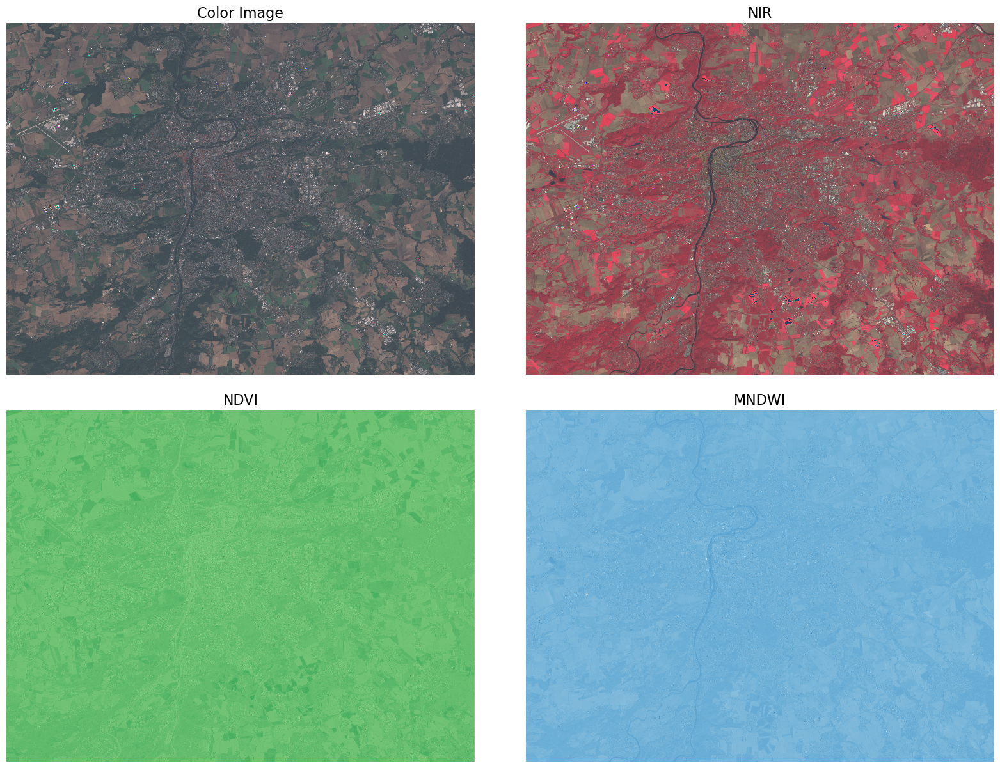

In [34]:
from matplotlib import pyplot as plt
# checking the images
fig, ax = plt.subplots(2, 2, figsize=(20, 15))

fontsize=16
ax = ax.flatten()

ax[0].imshow((rgb*255).astype(np.uint8), interpolation='none')
ax[0].axis('off')
ax[0].set_title('Color Image', fontsize=fontsize)

ax[1].imshow((nir*255).astype(np.uint8), interpolation='none')
ax[1].axis('off')
ax[1].set_title('NIR', fontsize=fontsize)

ax[2].imshow(ndvi, cmap='Greens', interpolation='none')
ax[2].axis('off')
ax[2].set_title('NDVI', fontsize=fontsize)

ax[3].imshow(mndwi, cmap='Blues', interpolation='none') # * 255).astype(np.uint8)
ax[3].axis('off')
ax[3].set_title('MNDWI', fontsize=fontsize)

plt.subplots_adjust(wspace=0.1, hspace=0.1)

plt.show()

Color image is a true color image, what one can observe for example from a plane. NIR image is more sensitive to different kind of vegetation and water areas. NDVI index gives a better response (higher values = greener because of the colormap we applied) over the vegetation areas and the MNDWI has a higher response (higher values = bluer because of the ‘Blues’ colormap) for water areas like rivers.

#### We can create mask for water areas using MNDWI index. Setting treshold for this index we can display only pixels with higher value representing water area and zero value for the rest.

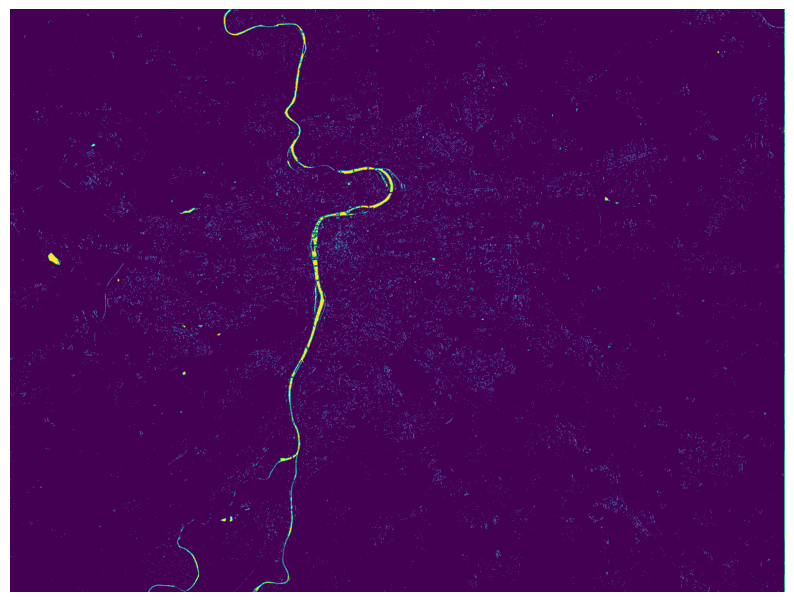

In [35]:
water_mask = mndwi > 0.07

plt.figure(figsize=(10,10))
plt.imshow(water_mask)
plt.axis("off")
plt.show()

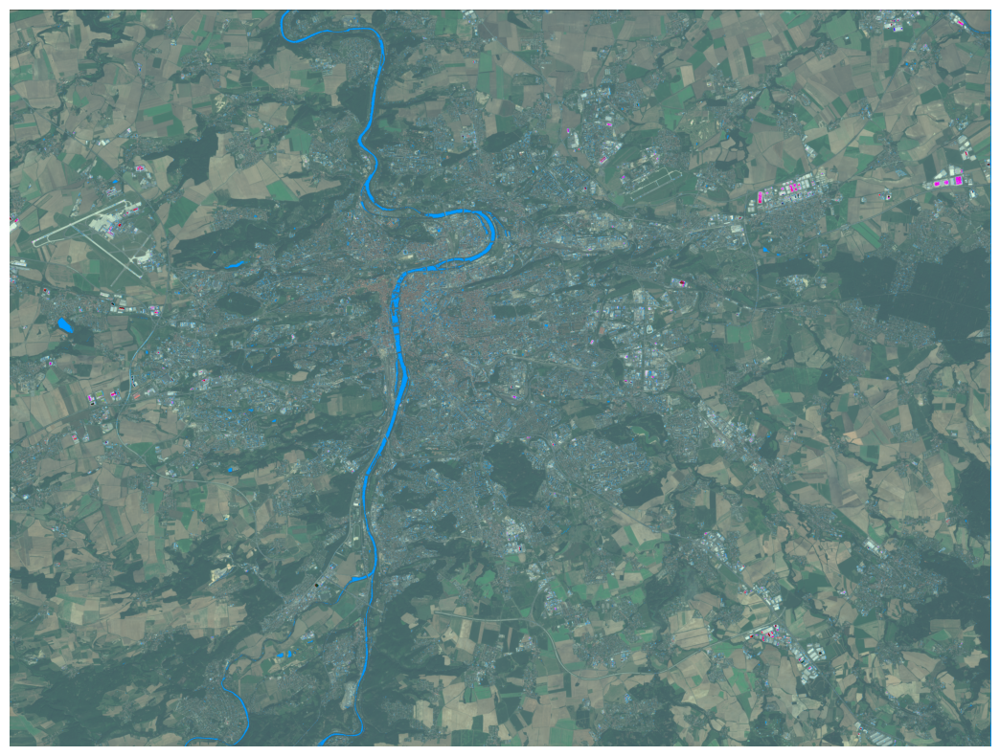

In [36]:
mask = water_mask
shape = img_rgb['B02'].shape
mask = mask[:shape[0], :shape[1]]

mask = np.where(img_rgb['B02'] == 0, 0, mask)

masked_rgb = plot_masked_rgb(red=img_rgb['B04'],
                             green=img_rgb['B03'],
                             blue=img_rgb['B02'],
                             mask=mask,
                             color_mask=(0, 0.6, 1),
                             transparency=0.0,
                             brightness=5.5
                            )

plt.figure(figsize=(15, 10))
plt.imshow((masked_rgb * 255).astype(np.uint8))
plt.axis("off")
plt.show()

#### Displaying water mask over true color image we end up with a nice illustration of the river Vltava and surronding water areas in Prague.  

#### We can play more with the bands and their order while displaying.

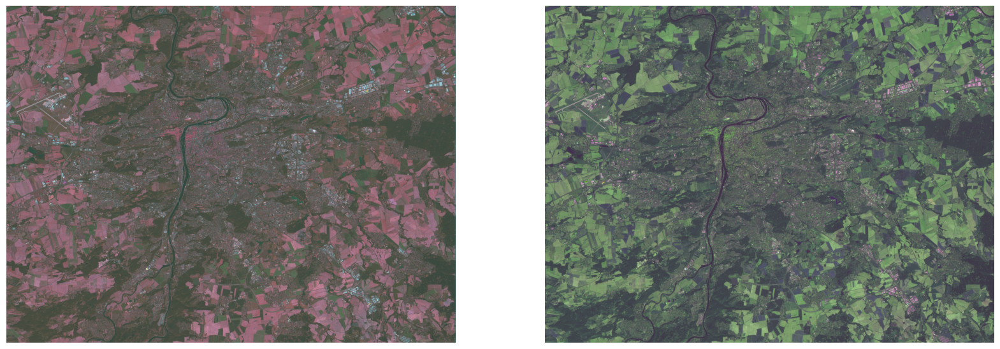

In [37]:
img = load_sentinel_image(folder_img, ["B03", "B04", "B12_res"])
rgb = image_rgb(img, 'B12_res', 'B03', 'B04', alpha=5.)
bgr = image_rgb(img, 'B04', 'B12_res', 'B03', alpha=5.)

fig, ax = plt.subplots(1, 2, figsize=(20, 15))
ax[0].imshow((rgb* 255).astype(np.uint8), cmap='Greens')
ax[0].axis('off')
ax[1].imshow((bgr* 255).astype(np.uint8), cmap='Blues')
ax[1].axis('off')
plt.show()

#### Here is the same image (same bands) but in different order creating different color labeling of the same areas.

#### Choosing different bands and their order, we can distinguish different areas in Sentinel images.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


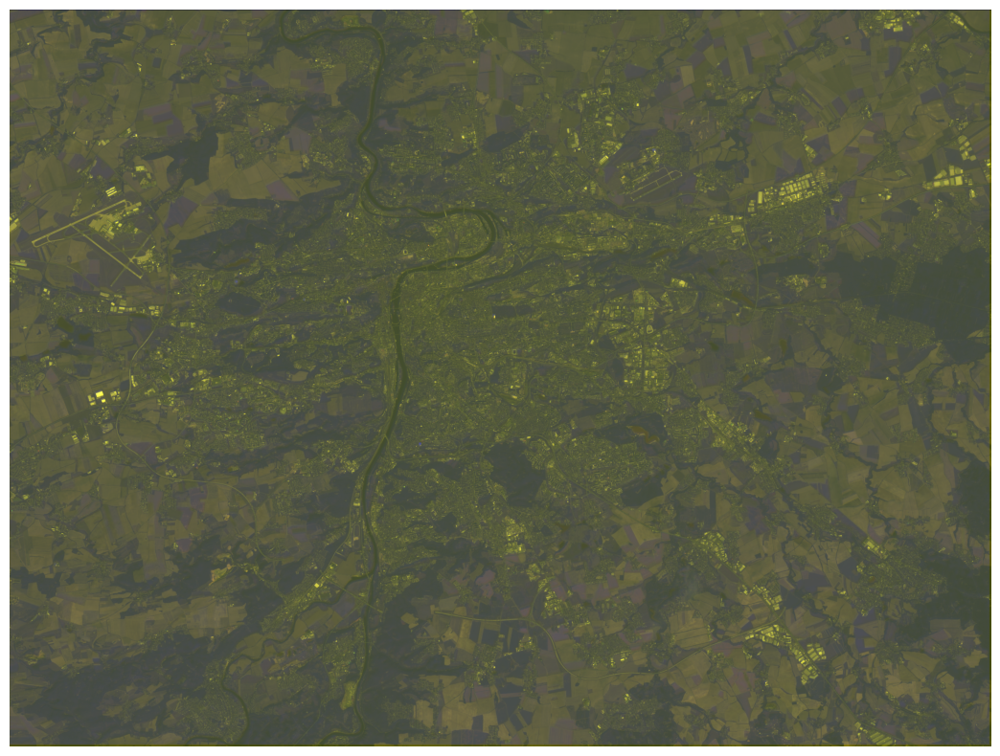

In [38]:
img = load_sentinel_image(folder_img, ["B02", "B03", "B09_res"])
display_rgb(img, 'B03', 'B02', 'B09_res', alpha=4.,figsize=(15, 10))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


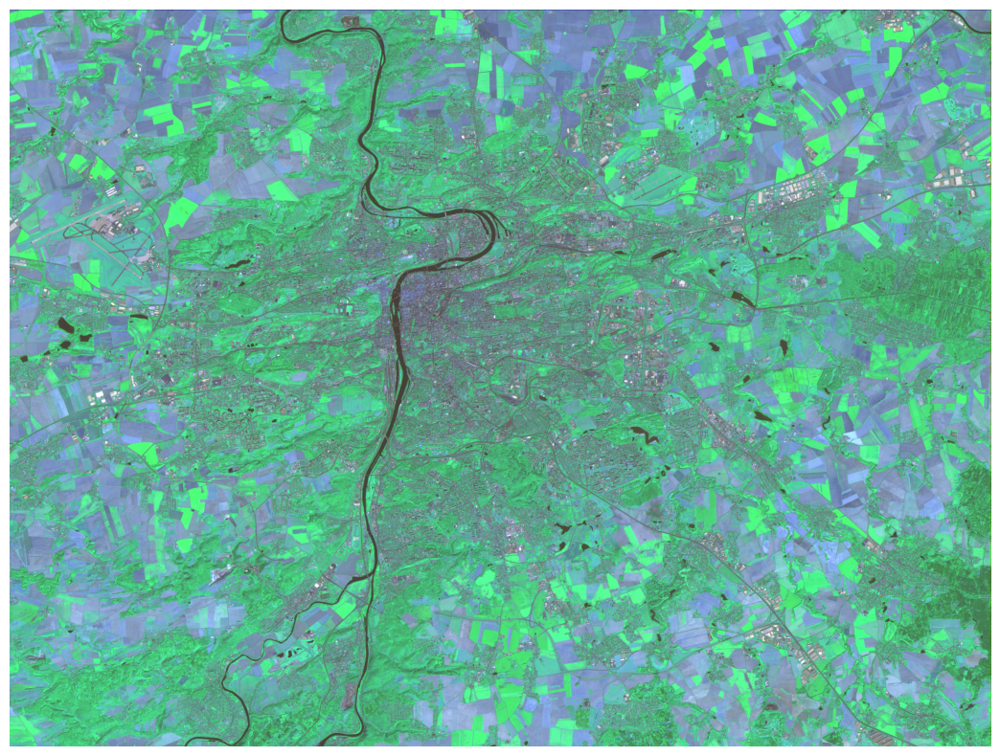

In [39]:
img = load_sentinel_image(folder_img, ["B04", "B08", "B11_res"])
display_rgb(img, 'B04', 'B08', 'B11_res', alpha=5.5,figsize=(15, 10))

### We can narrow down our analysis strictly within Prague boundaries

In [40]:
from coordinates_converter import coor_converter
coor_converter("geojson/prague.geojson","geojson/prague_GPScut.geojson",32633)

The file geojson/Praha/prague_GPScut.geojson has been saved!


In [41]:
import geopandas as gpd
import rasterio
from rasterio.plot import show

Prague_reg = "geojson/prague_GPScut.geojson"

gdf = gpd.read_file(Prague_reg)

rgb_tci = rasterio.open(folder_img + "TCI.tif")

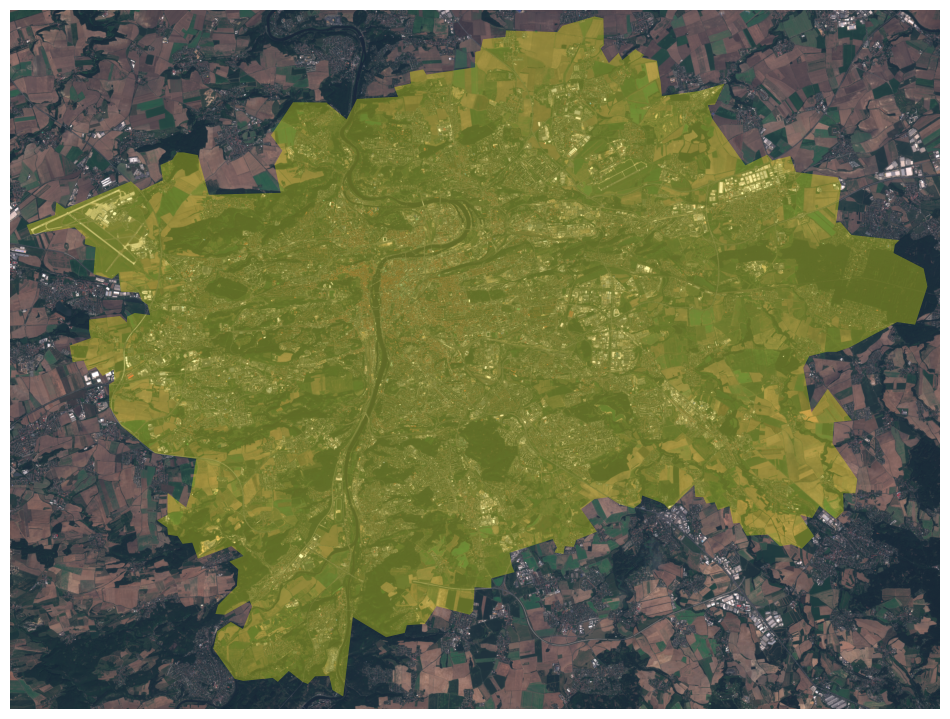

In [42]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 10))
show(rgb_tci,ax=ax)
gdf.plot(ax=ax, color='yellow', alpha=.3, aspect=1)
plt.axis("off")
plt.show()

In [44]:
import os
from image_clip import clipper
#directory = "Prague_sunny_clipped/"
path = "Prague_region/"
#path = os.path.join(directory, folder_prg)
os.mkdir(path)

In [45]:
clipper(folder_img,Prague_reg,path,"yes")

All clipped images are saved in Prague_region/ folder!


### We can look for parks, water surfaces or buildings in Prague area

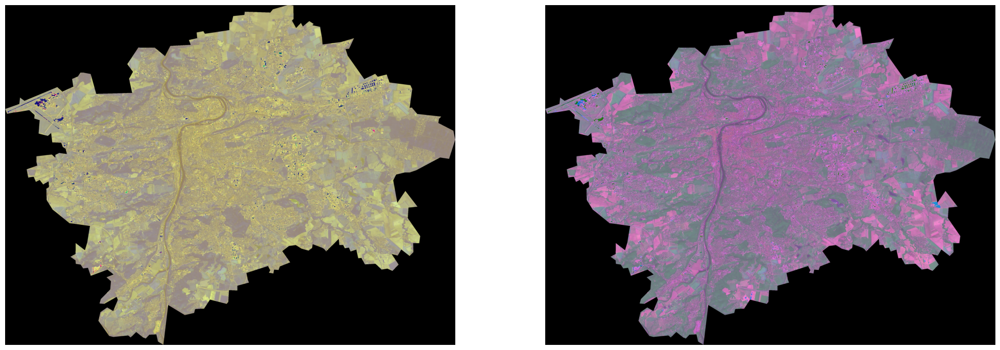

In [46]:
img = load_sentinel_image(path, ["B02", "B03", "B09_res"])
img1 = load_sentinel_image(path, ["B03", "B04", "B09_res"])
rgb = image_rgb(img, 'B02', 'B03', 'B09_res', alpha=7.5)
bgr = image_rgb(img1, 'B04', 'B09_res', 'B03', alpha=8.5)

fig, ax = plt.subplots(1, 2, figsize=(25, 20))
ax[0].imshow((rgb* 255).astype(np.uint8))
ax[0].axis('off')
ax[1].imshow((bgr* 255).astype(np.uint8))
ax[1].axis('off')
plt.show()

### Setting mask for green areas in Prague

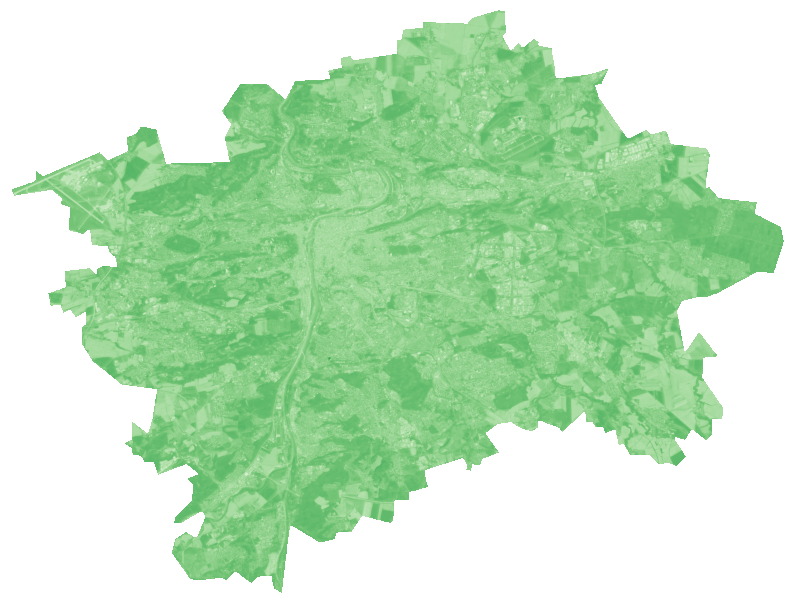

In [47]:
diff = normalized_difference(img1, 'B04', 'B09_res')

plt.figure(figsize=(10,10))
plt.imshow(diff, cmap = 'Greens_r')
plt.axis("off")
plt.show()

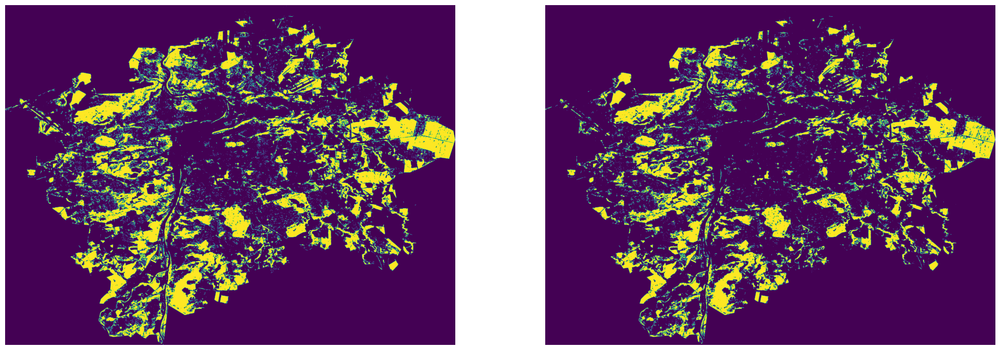

In [48]:
mask1 = diff < 0.02
mask2 = diff < 0.0

fig, ax = plt.subplots(1, 2, figsize=(25, 20))
ax[0].imshow(mask1)
ax[0].axis('off')
ax[1].imshow(mask2)
ax[1].axis('off')
plt.show()

Here we can choose the sensitivity of the mask - comparison of two masks with different treshold.

### Overlay image with highlighted green areas in Prague

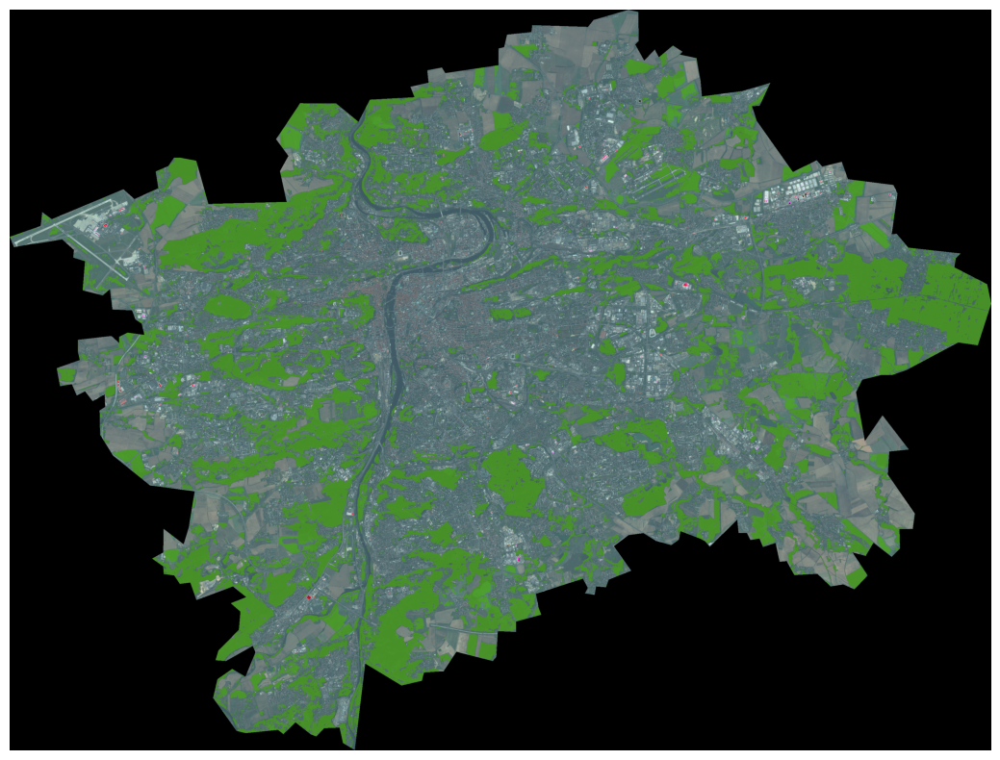

In [49]:
img_crgb = load_sentinel_image(path, ["B02", "B03", "B04"])
mask = mask2
shape = img_crgb['B02'].shape
mask = mask[:shape[0], :shape[1]]

mask = np.where(img_crgb['B02'] == 0, 0, mask)
 
masked_crgb = plot_masked_rgb(red=img_crgb['B04'],
                             green=img_crgb['B03'],
                             blue=img_crgb['B02'],
                             mask=mask,
                             color_mask=(0.3, 0.7, 0),
                             transparency=0.4,
                             brightness=5
                            )

plt.figure(figsize=(15, 10))
plt.imshow((masked_crgb * 255).astype(np.uint8))
plt.axis("off")
plt.show()

### Overlay image with highlighted green and water areas in Prague

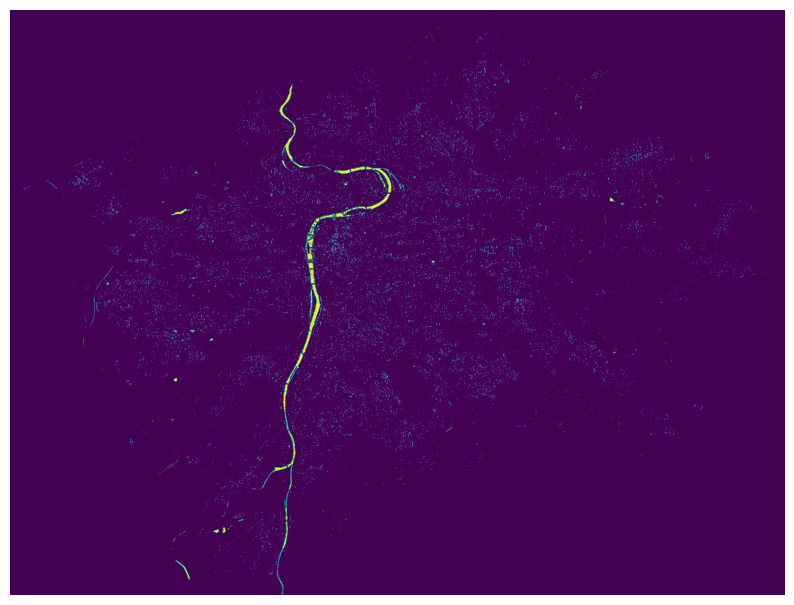

In [50]:
img_nir2 = load_sentinel_image(path, ["B03", "B04", "B05_res"])

mndwi = normalized_difference(img_nir2, 'B03', 'B05_res')

water_mask_crgb = mndwi > 0.07

plt.figure(figsize=(10,10))
plt.imshow(water_mask_crgb)
plt.axis("off")
plt.show()

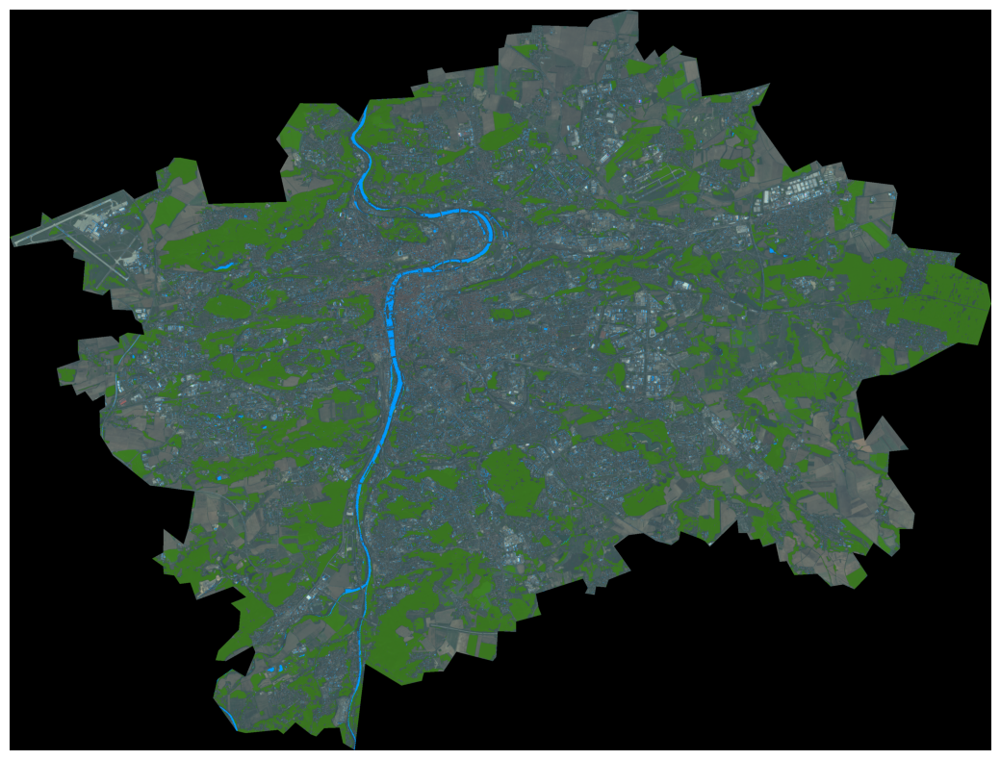

In [51]:
mask = water_mask_crgb
masked_rgb_trees = masked_crgb
shape = masked_rgb_trees[:,:,0].shape
mask = mask[:shape[0], :shape[1]]

mask = np.where(masked_rgb_trees[:,:,0] == 0, 0, mask)

masked_rgb_wt = plot_masked_rgb(masked_rgb_trees[:,:,0],masked_rgb_trees[:,:,1],masked_rgb_trees[:,:,2],
                             mask=mask,
                             color_mask=(0, 0.6, 1),
                             transparency=0,
                             brightness=4
                            )

plt.figure(figsize=(15, 10))
plt.imshow((masked_rgb_wt * 255).astype(np.uint8))
plt.axis("off")
plt.show()